# Baseline Modelling and Evaluations

This file includes the baseline modelling functions and evaluation approaches. OTWP dataset is used for testing the pipeline.


Importing new dataframe

In [0]:
# Import required libraries
from pyspark.sql.functions import col, when, count
from pyspark.ml.feature import VectorAssembler, StringIndexer, OneHotEncoder
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configure matplotlib for better plots
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Data paths configuration
DATA_BASE_DIR = "dbfs:/mnt/mids-w261/"
DATASETS_DIR = f"{DATA_BASE_DIR}datasets_final_project_2022/"



# Load datasets
print("\nLoading datasets...")

df = (
    spark.read.parquet("dbfs:/FileStore/Group_4_3/Data/Pipeline_Output/OTPW_60M_PARQUET")

)

# On-Time Performance Weather dataset (main dataset for analysis)
# df_otpw = spark.read.format("csv").option("header", "true").load(f"{DATA_BASE_DIR}OTPW_12M/OTPW_12M/")
# print(f"OTPW dataset loaded: {df_otpw.count():,} records")



Loading datasets...


In [0]:
display(df)

ORIGIN,TAIL_NUM,YEAR,DEST,DEP_DELAY,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,CRS_ARR_TIME,CRS_ELAPSED_TIME,CANCELLED,DIVERTED,DISTANCE,ELEVATION,REDIRECTED_FLIGHT,RECENT_DEST_CANCELLED_COUNT_6_2H,RECENT_DEST_DIVERSION_COUNT_6_2H,ORIGIN_BETWEENNESS,ORIGIN_DEGREE,ORIGIN_CLOSENESS,DEST_BETWEENNESS,DEST_DEGREE,DEST_CLOSENESS,PREV_FLIGHT_FLAG,PREV2_FLIGHT_FLAG,NEXT_FLIGHT_FLAG,CRS_DEP_TIME_MINUTES,TIME_BETWEEN_ARR_AND_SCHEDULED_DEP,PREV_DEP_DELAY,PREV2_ARRIVAL_DELAY,PREV2_DEP_DELAY,PREV2_TIME_BETWEEN_ARR_AND_SCHEDULED_DEP,CRS_DEP_TIME_MINUTES_NEXT,TIME_BETWEEN_SCHEDULED_ARR_AND_SCHEDULED_NEXT_DEP,ADVERSE_2H,HOURLYVISIBILITY_2H,HOURLYVISIBILITY_3H,HOURLYVISIBILITY_4H,HOURLYVISIBILITY_5H,HOURLYVISIBILITY_6H,HOURLYWINDSPEED_2H,HOURLYWINDSPEED_3H,HOURLYWINDSPEED_4H,HOURLYWINDSPEED_5H,HOURLYWINDSPEED_6H,HOURLYWINDGUSTSPEED_2H,HOURLYWINDGUSTSPEED_3H,HOURLYWINDGUSTSPEED_4H,HOURLYWINDGUSTSPEED_5H,HOURLYWINDGUSTSPEED_6H,HOURLYPRECIPITATION_2H,HOURLYPRECIPITATION_3H,HOURLYPRECIPITATION_4H,HOURLYPRECIPITATION_5H,HOURLYPRECIPITATION_6H,HOURLYDRYBULBTEMPERATURE_2H,HOURLYDRYBULBTEMPERATURE_3H,HOURLYDRYBULBTEMPERATURE_4H,HOURLYDRYBULBTEMPERATURE_5H,HOURLYDRYBULBTEMPERATURE_6H,HOURLYSEALEVELPRESSURE_2H,HOURLYSEALEVELPRESSURE_3H,HOURLYSEALEVELPRESSURE_4H,HOURLYSEALEVELPRESSURE_5H,HOURLYSEALEVELPRESSURE_6H,UNIQUE_ORIGINS,NUM_WITHIN_100_MILES,HOLIDAY_WITHIN_3D,USED_DAYS_SO_FAR,CALENDAR_DAYS_SO_FAR,TAIL_NUM_USE,ORIGIN_RELATIVE_TRAFFIC
AZA,215NV,2018,SCK,0.0,3,7,23,1,G4,1432,104.0,0.0,0.0,625.0,421.2,0,0,0,0.017240512691631064,0.21387283236994217,13.345561088113378,0.0,0.017341040462427744,24.358121590642845,1,0,1,768,null,null,null,null,null,701,null,0,30.0,30.0,45.0,45.0,45.0,10.0,14.0,11.0,11.0,10.0,20.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,111.0,113.0,111.0,111.0,109.0,1013.0,1013.0,1013.0,1013.0,1013.0,75,0,0,127,204,62.254901960784316,1.0933940774487472
AZA,215NV,2018,GRI,-6.0,3,7,23,1,G4,1056,136.0,0.0,0.0,905.0,421.2,0,0,0,0.017240512691631064,0.21387283236994217,13.345561088113378,0.0,0.017341040462427744,30.348575184938387,0,1,1,400,null,null,35.0,30.0,null,701,null,0,45.0,45.0,45.0,10.0,45.0,9.0,9.0,6.0,6.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,102.0,100.0,99.0,95.0,90.0,1013.0,1013.0,1013.0,1013.0,1013.0,76,0,0,127,204,62.254901960784316,1.0933940774487472
GRI,215NV,2018,AZA,-1.0,3,7,23,1,G4,1158,137.0,0.0,0.0,905.0,560.8,0,0,0,0.0,0.017341040462427744,30.348575184938387,0.017240512691631064,0.21387283236994217,13.345561088113378,1,0,1,701,null,-6.0,null,null,null,400,null,1,10.0,10.0,9.94,10.0,9.0,15.0,15.0,13.0,10.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85.0,84.0,77.0,76.0,74.0,30.12,30.12,30.14,1013.0,1013.0,76,0,0,127,204,62.254901960784316,1.2631578947368423
SCK,215NV,2018,SAN,17.0,3,7,23,1,G4,1634,77.0,0.0,0.0,423.0,7.9,0,0,0,0.0,0.017341040462427744,24.358121590642845,1.6754628466113764E-5,0.34104046242774566,47.12196084993568,0,1,1,917,null,null,25.0,25.0,null,400,null,0,10.0,10.0,10.0,10.0,9.94,13.0,11.0,16.0,14.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,81.0,86.0,90.0,94.0,99.0,29.94,29.93,29.93,29.93,29.91,76,0,0,127,204,62.254901960784316,0.8695652173913044
SCK,215NV,2018,AZA,30.0,3,7,23,1,G4,2106,104.0,0.0,0.0,625.0,7.9,0,0,0,0.0,0.017341040462427744,24.358121590642845,0.017240512691631064,0.21387283236994217,13.345561088113378,1,0,1,1162,null,null,null,null,null,400,null,0,10.0,10.0,9.94,10.0,10.0,3.0,7.0,9.0,9.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,71.0,72.0,80.0,80.0,81.0,29.96,29.96,29.94,29.94,29.94,76,0,0,127,204,62.254901960784316,0.8695652173913044
SAN,215NV,2018,SCK,25.0,3,7,23,1,G4,1837,78.0,0.0,0.0,423.0,4.6,0,0,0,1.6754628466113764E-5,0.34104046242774566,47.12196084993568,0.0,0.017341040462427744,24.358121590642845,1,0,1,1039,null,null,null,null,null,917,null,0,9.94,10.0,10.0,10.0,10.0,6.0,6.0,5.0,6.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,75.0,75.0,75.0,76.0,78.0,29.91,29.91,29.91,29.9,29.89,75,0,0,127,204,62.254901960784316,0.9792176039119803
SBN,215NV,2018,AZA,6.0,3,8

Extracting 5000000 lines from df_otpw for pipeline testing. File called df_otpw_small

In [0]:
from pyspark.sql.functions import rand

# Add a random number once, cache result
df_cached = df.withColumn("_rand", rand(seed=42)).cache()

# Then limit
df_small = df_cached.orderBy("_rand").limit(100000)

In [0]:
# Print df_otpw_small head
display(df_small)

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:132)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:132)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:129)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:129)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:715)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:435)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:435)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.can

In [0]:
df.columns

['ORIGIN',
 'TAIL_NUM',
 'YEAR',
 'DEST',
 'DEP_DELAY',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'OP_UNIQUE_CARRIER',
 'CRS_ARR_TIME',
 'CRS_ELAPSED_TIME',
 'CANCELLED',
 'DIVERTED',
 'DISTANCE',
 'ELEVATION',
 'REDIRECTED_FLIGHT',
 'RECENT_DEST_CANCELLED_COUNT_6_2H',
 'RECENT_DEST_DIVERSION_COUNT_6_2H',
 'ORIGIN_BETWEENNESS',
 'ORIGIN_DEGREE',
 'ORIGIN_CLOSENESS',
 'DEST_BETWEENNESS',
 'DEST_DEGREE',
 'DEST_CLOSENESS',
 'PREV_FLIGHT_FLAG',
 'PREV2_FLIGHT_FLAG',
 'NEXT_FLIGHT_FLAG',
 'CRS_DEP_TIME_MINUTES',
 'TIME_BETWEEN_ARR_AND_SCHEDULED_DEP',
 'PREV_DEP_DELAY',
 'PREV2_ARRIVAL_DELAY',
 'PREV2_DEP_DELAY',
 'PREV2_TIME_BETWEEN_ARR_AND_SCHEDULED_DEP',
 'CRS_DEP_TIME_MINUTES_NEXT',
 'TIME_BETWEEN_SCHEDULED_ARR_AND_SCHEDULED_NEXT_DEP',
 'ADVERSE_2H',
 'HOURLYVISIBILITY_2H',
 'HOURLYVISIBILITY_3H',
 'HOURLYVISIBILITY_4H',
 'HOURLYVISIBILITY_5H',
 'HOURLYVISIBILITY_6H',
 'HOURLYWINDSPEED_2H',
 'HOURLYWINDSPEED_3H',
 'HOURLYWINDSPEED_4H',
 'HOURLYWINDSPEED_5H',
 'HOURLYWINDSP


## Baseline Model

Below is a self contained function for running linear regression or XGBoost. Function handles null target dropping, imputating, and categorical one hot encoding.

This function also handles date-based train-split. If you don't set a date, then it will treat the whole function as a train set.

Function outputs statistics automatically.

### Cross evaluation function

In [0]:
from pyspark.sql.functions import col, lit
from pyspark.ml.tuning import ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator

from pyspark.sql import functions as F
from pyspark.sql.functions import col, lit

from pyspark.sql import functions as F
from pyspark.sql.functions import col, lit

def time_series_cv_slow(
    pipeline, df, evaluator, param_grid,
    year_col="YEAR", month_col="MONTH", day_col="DAY_OF_MONTH",
    n_splits=5
):
    # --- Build day-level date key safely ---
    y = F.col(year_col).cast("int")
    m = F.col(month_col).cast("int")
    d = F.col(day_col).cast("int")

    # Zero-pad and assemble "yyyy-MM-dd" then to_date
    date_str = F.format_string("%04d-%02d-%02d", y, m, d)
    event_date = F.to_date(date_str)  # DATE type

    dfk = (df
        .withColumn("event_key", event_date)                 # DATE
        .filter(col("event_key").isNotNull())
        .withColumn("ts", F.col("event_key").cast("timestamp").cast("long"))  # seconds since epoch
        .persist()
    )

    # Cheap emptiness check (works everywhere)
    if dfk.limit(1).count() == 0:
        raise ValueError("No rows after building event_key; check YEAR/MONTH/DAY types and nulls.")

    # Quantile cut points (balanced by time, scalable)
    stats = dfk.select(F.min("ts").alias("min_ts"), F.max("ts").alias("max_ts")).collect()[0]
    if stats.min_ts is None or stats.max_ts is None:
        raise ValueError("event_key->ts was NULL for all rows; inspect input columns.")
    min_ts, max_ts = stats.min_ts, stats.max_ts

    qs = [i / (n_splits + 1) for i in range(1, n_splits + 1)]
    mids = dfk.approxQuantile("ts", qs, 0.01)   # set err=0.0 for exact, slower
    cuts = [min_ts] + mids + [max_ts + 1]       # make upper bound exclusive

    # Grid search over folds
    param_maps = param_grid.build()
    best_avg = float("inf"); best_params = None

    for params in param_maps:
        scores = []
        for i in range(n_splits):
            train_end = cuts[i+1]
            test_start = train_end
            test_end = cuts[i+2]

            train_i = dfk.filter(col("ts") <  lit(train_end))
            test_i  = dfk.filter((col("ts") >= lit(test_start)) & (col("ts") < lit(test_end)))

            # Skip empty folds gracefully
            if train_i.limit(1).count() == 0 or test_i.limit(1).count() == 0:
                continue

            model_i = pipeline.copy(params).fit(train_i)
            preds   = model_i.transform(test_i)
            scores.append(evaluator.evaluate(preds))

        if scores:
            avg_score = sum(scores) / len(scores)
            if avg_score < best_avg:
                best_avg, best_params = avg_score, params

    if best_params is None:
        raise RuntimeError("No valid folds evaluated—check coverage and split construction.")

    best_model = pipeline.copy(best_params).fit(dfk.drop("event_key", "ts"))
    return best_model, best_params, best_avg

In [0]:
from pyspark.sql.functions import col, lit
from pyspark.ml.tuning import ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator

from pyspark.sql import functions as F
from pyspark.sql.functions import col, lit

from pyspark.sql import functions as F
from pyspark.sql.functions import col, lit

In [0]:
def time_series_cv(
    pipeline, df, evaluator, param_grid=None,
    year_col="YEAR", month_col="MONTH", day_col="DAY_OF_MONTH",
    n_splits=5, do_grid_search=True
):
    from pyspark.sql import functions as F
    from pyspark.sql.functions import col, lit
    from pyspark.ml import Pipeline

    # Build day key
    y = F.col(year_col).cast("int"); m = F.col(month_col).cast("int"); d = F.col(day_col).cast("int")
    dfk = (df.withColumn("event_key", F.to_date(F.format_string("%04d-%02d-%02d", y, m, d)))
             .filter(col("event_key").isNotNull())
             .withColumn("ts", col("event_key").cast("timestamp").cast("long"))
             .persist())
    if dfk.limit(1).count() == 0:
        raise ValueError("No rows after building event_key.")

    # Cuts by quantiles
    mm = dfk.select(F.min("ts").alias("a"), F.max("ts").alias("b")).collect()[0]
    qs = [i/(n_splits+1) for i in range(1, n_splits+1)]
    mids = dfk.approxQuantile("ts", qs, 0.01)
    cuts = [mm.a] + mids + [mm.b + 1]

    # --- split pipeline into feature and model ---
    stages = pipeline.getStages()
    feature_pipe = Pipeline(stages=stages[:-1])
    model_proto  = stages[-1]  # estimator
    # param maps
    if do_grid_search and param_grid is not None:
        param_maps = param_grid.build() or [dict()]
    else:
        param_maps = [dict()]  # defaults only

    # prepare aggregation
    agg = {id(pm): [pm, []] for pm in param_maps}

    best_avg = float("inf"); best_params = None

    for i in range(n_splits):
        train_end, test_start, test_end = cuts[i+1], cuts[i+1], cuts[i+2]
        train_i = dfk.filter(col("ts") <  lit(train_end))
        test_i  = dfk.filter((col("ts") >= lit(test_start)) & (col("ts") < lit(test_end)))
        if train_i.limit(1).count() == 0 or test_i.limit(1).count() == 0:
            continue

        # Fit feature pipe ONCE per fold
        feat_model = feature_pipe.fit(train_i)
        Xtr = feat_model.transform(train_i).select("features", evaluator.getLabelCol()).cache()
        Xte = feat_model.transform(test_i ).select("features", evaluator.getLabelCol()).cache()
        _ = Xtr.count(); _ = Xte.count()

        # Evaluate params on cached features
        for pm in param_maps:
            model_i = model_proto.copy(pm).fit(Xtr)
            preds   = model_i.transform(Xte)
            score   = evaluator.evaluate(preds)
            agg[id(pm)][1].append(score)

    # pick best averaged across folds
    for _, (pm, scores) in agg.items():
        if scores:
            avg = sum(scores)/len(scores)
            if avg < best_avg:
                best_avg, best_params = avg, pm

    if best_params is None:
        raise RuntimeError("No valid folds evaluated.")

    print(f"Best ({evaluator.getMetricName()}):", best_avg)
    print("Best params:" , best_params if do_grid_search else "(defaults)")

    # Train final model on ALL data using best params (or defaults)
    final_est  = model_proto.copy(best_params)
    final_pipe = Pipeline(stages=feature_pipe.getStages() + [final_est])
    final_model = final_pipe.fit(dfk)

    return final_model, (best_params if do_grid_search else {}), best_avg

### Create Model Function

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.functions import col
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, Imputer, VectorAssembler
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.regression import LinearRegression
from xgboost.spark import SparkXGBRegressor
from pyspark.ml.tuning import ParamGridBuilder
import warnings

def create_model(
    df,
    numeric_features,
    cat_features=None,
    target_col="DEP_DELAY_NEW",
    year_col="YEAR",
    test_start_date=None,
    model_type="linear",  # or "xgboost"
    dev_mode=False,
    xgb_params=None,
    *,
    cross_validate: bool = False,
    cv_n_splits: int = 5,
    use_log_target: bool = True,        
):
    """
    Creates a model and outputs metrics and predictions. Supports linear or XGBoost models.
    When use_log_target=True, trains on signed log1p(|y|) and evaluates on original scale.
    """

    if dev_mode:
        df.sparkSession.conf.set("spark.sql.shuffle.partitions", "8")

    cat_features = cat_features or []
    log_label = f"log1p_{target_col}"
    label_col = log_label if use_log_target else target_col

    # Cast numerics and target; drop null target
    df_typed = (
        df.select(
            *[F.col(c).cast("double").alias(c) for c in numeric_features + [target_col]],
            *cat_features
        ).where(F.col(target_col).isNotNull())
    )

    # Optional signed log1p transform for the target
    if use_log_target:
        y = F.col(target_col).cast("double")
        safe = F.signum(y) * F.log1p(F.abs(y))
        df_typed = (
            df_typed
            .withColumn(log_label, safe)
            .filter(F.col(log_label).isNotNull())
            .filter(~F.isnan(log_label))
        )

    # Chronological split
    if test_start_date:
        train_df = df_typed.filter(col(year_col) < F.lit(test_start_date)).cache()
        test_df  = df_typed.filter(col(year_col) == F.lit(test_start_date)).cache()
        print(f"Train rows: {train_df.count():,} | Test rows: {test_df.count():,}")
    else:
        train_df, test_df = df_typed.cache(), None
        _ = train_df.count()
        print("No test split; training on all data.")

    stages = []

    # Impute numerics
    imputer = Imputer(inputCols=numeric_features, outputCols=[f"{c}_imp" for c in numeric_features])
    stages.append(imputer)

    # Categorical encoding
    idx_cols, ohe_cols = [], []
    for c in cat_features:
        idx = f"{c}_idx"
        stages.append(StringIndexer(inputCol=c, outputCol=idx, handleInvalid="keep"))
        idx_cols.append(idx)

    # OHE only for linear
    if model_type == "linear" and cat_features:
        ohe_cols = [f"{c}_ohe" for c in cat_features]
        stages.append(OneHotEncoder(inputCols=idx_cols, outputCols=ohe_cols, dropLast=True))

    # Assemble features
    feature_cols = [f"{c}_imp" for c in numeric_features] + (ohe_cols if model_type == "linear" else idx_cols)
    stages.append(VectorAssembler(inputCols=feature_cols, outputCol="features"))
    print(f"Training model on {len(feature_cols)} features: {feature_cols}")

    # Estimator + param grid
    param_grid = None
    if model_type == "linear":
        model_stage = LinearRegression(labelCol=label_col, featuresCol="features", maxIter=50)
        param_grid = (
            ParamGridBuilder()
            .addGrid(model_stage.maxIter, [10, 50, 100])
            .addGrid(model_stage.regParam, [0.0, 0.1, 0.5])
        )
    elif model_type == "xgboost":
        params = dict(
            label_col=label_col,
            features_col="features",
            max_depth=4,
            learning_rate=0.05,
            min_child_weight=1,
            subsample=0.8,
            colsample_bytree=0.8,
            objective="reg:squarederror",
            eval_metric="rmse",
            missing=float("nan"),
            num_workers=4,
            num_early_stopping_rounds=30,
            tree_method="hist",
            n_estimators=1000,
        )
        if xgb_params:
            params.update(xgb_params)
        model_stage = SparkXGBRegressor(**params)
        param_grid = (
            ParamGridBuilder()
                .addGrid(model_stage.max_depth, [4, 6, 8])
                .addGrid(model_stage.min_child_weight, [1, 10])
                .addGrid(model_stage.learning_rate, [0.05, 0.10])
        )
    else:
        raise ValueError("Unsupported model type")

    stages.append(model_stage)
    pipeline = Pipeline(stages=stages)

    # CV evaluator works on the training label scale (log or original)
    evaluator_cv = RegressionEvaluator(labelCol=label_col, predictionCol="prediction", metricName="rmse")

    # === Optional CV ===
    if cross_validate:
        if param_grid is None:
            warnings.warn("param_grid is None; skipping cross-validation.")
            cross_validate = False
        else:
            print(f"Performing time-series CV (n_splits={cv_n_splits})...")
            best_model, best_params, best_rmse = time_series_cv(
                pipeline,
                train_df,
                year_col="YEAR",
                month_col="MONTH",
                day_col="DAY_OF_MONTH",
                evaluator=evaluator_cv,
                param_grid=param_grid,
                n_splits=cv_n_splits,
                do_grid_search=False
            )
            print("Best RMSE:", best_rmse)
            print("Best params:", best_params)

    if not cross_validate:
        best_model = pipeline.fit(train_df)
        best_params, best_rmse = None, None
        print("Fitted single model (no CV).")

    # Predictions
    train_pred = best_model.transform(train_df).cache()
    test_pred = best_model.transform(test_df).cache() if test_df is not None else None

    # Create prediction on minutes scale for evaluation
    def to_minutes(df_):
        if df_ is None:
            return None
        if use_log_target:
            z = F.col("prediction")
            return df_.withColumn("prediction_minutes", F.signum(z) * F.expm1(F.abs(z)))
        else:
            return df_.withColumn("prediction_minutes", F.col("prediction"))

    train_bt = to_minutes(train_pred)
    test_bt  = to_minutes(test_pred)

    print("Running evaluation...")

    # Metrics on original scale
    eval_rmse = RegressionEvaluator(labelCol=target_col, predictionCol="prediction_minutes", metricName="rmse")
    eval_r2   = RegressionEvaluator(labelCol=target_col, predictionCol="prediction_minutes", metricName="r2")

    train_mae = train_bt.select(F.abs(F.col(target_col) - F.col("prediction_minutes")).alias("ae")).agg(F.mean("ae")).first()[0]
    test_mae = (
        test_bt.select(F.abs(F.col(target_col) - F.col("prediction_minutes")).alias("ae")).agg(F.mean("ae")).first()[0]
        if test_bt is not None else None
    )

    train_rmse = eval_rmse.evaluate(train_bt)
    train_r2   = eval_r2.evaluate(train_bt)
    test_rmse  = eval_rmse.evaluate(test_bt) if test_bt is not None else None
    test_r2    = eval_r2.evaluate(test_bt) if test_bt is not None else None

    print(f"\n=== {model_type.upper()} MODEL ===  use_log_target={use_log_target}")
    print(f"TRAIN RMSE(min): {train_rmse:.2f} | MAE: {train_mae:.2f} | R²: {train_r2:.4f}")
    if test_bt is not None:
        print(f"TEST  RMSE(min): {test_rmse:.2f} | MAE: {test_mae:.2f} | R²: {test_r2:.4f}")

    return best_model, train_bt, test_bt, {
        "train_rmse": train_rmse,
        "train_mae": train_mae,
        "train_r2": train_r2,
        "test_rmse": test_rmse,
        "test_mae": test_mae,
        "test_r2": test_r2,
        "model_type": model_type,
        "cv_best_rmse": best_rmse,
        "cv_best_params": best_params,
        "use_log_target": use_log_target,
    }

In [0]:
df_numeric = df.withColumn("DEP_DELAY_NUM", col("DEP_DELAY").cast("float"))

In [0]:
# Compute the 99th percentile delay
threshold = df_numeric.approxQuantile("DEP_DELAY_NUM", [0.99], 0.01)[0]
print(f"99th percentile delay: {threshold} minutes")


99th percentile delay: 2755.0 minutes


In [0]:
# Add a column with capped delays
df_capped = df.withColumn(
    "DEP_DELAY_CAPPED",
    F.when(F.col("DEP_DELAY") > threshold, threshold)
     .when(F.col("DEP_DELAY") < -threshold, -threshold)
     .otherwise(F.col("DEP_DELAY"))
)

In [0]:
delayed_df = df.filter(col("dep_delay") > 720)
print(delayed_df.count())

14902


In [0]:
COL_CATEGORICAL = [
    "ORIGIN", "DEST", "TAIL_NUM", "OP_UNIQUE_CARRIER",
    "YEAR", "QUARTER", "MONTH", "DAY_OF_MONTH", "DAY_OF_WEEK",
    "CANCELLED", "DIVERTED",
    "REDIRECTED_FLIGHT",
    "PREV_FLIGHT_FLAG", "PREV2_FLIGHT_FLAG", "NEXT_FLIGHT_FLAG",
    "HOLIDAY_WITHIN_3D"
]


COL_NUMERIC = [
    "CRS_ARR_TIME", "CRS_ELAPSED_TIME", "DISTANCE", "ELEVATION",
    "CRS_DEP_TIME_MINUTES", "TIME_BETWEEN_ARR_AND_SCHEDULED_DEP",
    "PREV_DEP_DELAY", "PREV2_ARRIVAL_DELAY", "PREV2_DEP_DELAY",
    "PREV2_TIME_BETWEEN_ARR_AND_SCHEDULED_DEP", "CRS_DEP_TIME_MINUTES_NEXT",
    "TIME_BETWEEN_SCHEDULED_ARR_AND_SCHEDULED_NEXT_DEP",

    "RECENT_DEST_CANCELLED_COUNT_6_2H", "RECENT_DEST_DIVERSION_COUNT_6_2H",
    "ADVERSE_2H", "HOURLYVISIBILITY_2H", "HOURLYVISIBILITY_3H",
    "HOURLYVISIBILITY_4H", "HOURLYVISIBILITY_5H", "HOURLYVISIBILITY_6H",
    "HOURLYWINDSPEED_2H", "HOURLYWINDSPEED_3H", "HOURLYWINDSPEED_4H",
    "HOURLYWINDSPEED_5H", "HOURLYWINDSPEED_6H",
    "HOURLYWINDGUSTSPEED_2H", "HOURLYWINDGUSTSPEED_3H",
    "HOURLYWINDGUSTSPEED_4H", "HOURLYWINDGUSTSPEED_5H", "HOURLYWINDGUSTSPEED_6H",
    "HOURLYPRECIPITATION_2H", "HOURLYPRECIPITATION_3H", "HOURLYPRECIPITATION_4H",
    "HOURLYPRECIPITATION_5H", "HOURLYPRECIPITATION_6H",
    "HOURLYDRYBULBTEMPERATURE_2H", "HOURLYDRYBULBTEMPERATURE_3H",
    "HOURLYDRYBULBTEMPERATURE_4H", "HOURLYDRYBULBTEMPERATURE_5H",
    "HOURLYDRYBULBTEMPERATURE_6H",
    "HOURLYSEALEVELPRESSURE_2H", "HOURLYSEALEVELPRESSURE_3H",
    "HOURLYSEALEVELPRESSURE_4H", "HOURLYSEALEVELPRESSURE_5H",
    "HOURLYSEALEVELPRESSURE_6H",

    "ORIGIN_BETWEENNESS", "ORIGIN_DEGREE", "ORIGIN_CLOSENESS",
    "DEST_BETWEENNESS", "DEST_DEGREE", "DEST_CLOSENESS",

    "UNIQUE_ORIGINS", "NUM_WITHIN_100_MILES",
    "USED_DAYS_SO_FAR", "CALENDAR_DAYS_SO_FAR", "TAIL_NUM_USE",
    "ORIGIN_RELATIVE_TRAFFIC"
]


model, train_pred, test_pred, metrics = create_model(
    df=df_capped,
    numeric_features=COL_NUMERIC,
    cat_features=COL_CATEGORICAL,
    model_type="xgboost",
    target_col="DEP_DELAY_CAPPED",
    year_col="YEAR",
    test_start_date="2019"
)

Train rows: 23,920,802 | Test rows: 7,259,155
Training model on 73 features: ['CRS_ARR_TIME_imp', 'CRS_ELAPSED_TIME_imp', 'DISTANCE_imp', 'ELEVATION_imp', 'CRS_DEP_TIME_MINUTES_imp', 'TIME_BETWEEN_ARR_AND_SCHEDULED_DEP_imp', 'PREV_DEP_DELAY_imp', 'PREV2_ARRIVAL_DELAY_imp', 'PREV2_DEP_DELAY_imp', 'PREV2_TIME_BETWEEN_ARR_AND_SCHEDULED_DEP_imp', 'CRS_DEP_TIME_MINUTES_NEXT_imp', 'TIME_BETWEEN_SCHEDULED_ARR_AND_SCHEDULED_NEXT_DEP_imp', 'RECENT_DEST_CANCELLED_COUNT_6_2H_imp', 'RECENT_DEST_DIVERSION_COUNT_6_2H_imp', 'ADVERSE_2H_imp', 'HOURLYVISIBILITY_2H_imp', 'HOURLYVISIBILITY_3H_imp', 'HOURLYVISIBILITY_4H_imp', 'HOURLYVISIBILITY_5H_imp', 'HOURLYVISIBILITY_6H_imp', 'HOURLYWINDSPEED_2H_imp', 'HOURLYWINDSPEED_3H_imp', 'HOURLYWINDSPEED_4H_imp', 'HOURLYWINDSPEED_5H_imp', 'HOURLYWINDSPEED_6H_imp', 'HOURLYWINDGUSTSPEED_2H_imp', 'HOURLYWINDGUSTSPEED_3H_imp', 'HOURLYWINDGUSTSPEED_4H_imp', 'HOURLYWINDGUSTSPEED_5H_imp', 'HOURLYWINDGUSTSPEED_6H_imp', 'HOURLYPRECIPITATION_2H_imp', 'HOURLYPRECIPITATION_3

2025-08-09 22:20:51,126 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 4 workers with
	booster params: {'objective': 'reg:squarederror', 'colsample_bytree': 0.8, 'device': 'cpu', 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.8, 'tree_method': 'hist', 'num_early_stopping_rounds': 30, 'eval_metric': 'rmse', 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 1000}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2025-08-09 22:36:08,853 INFO XGBoost-PySpark: _fit Finished xgboost training!


Fitted single model (no CV).
Running evaluation...

=== XGBOOST MODEL ===  use_log_target=True
TRAIN RMSE(min): 41.08 | MAE: 14.19 | R²: 0.0246
TEST  RMSE(min): 49.39 | MAE: 15.94 | R²: -0.0218


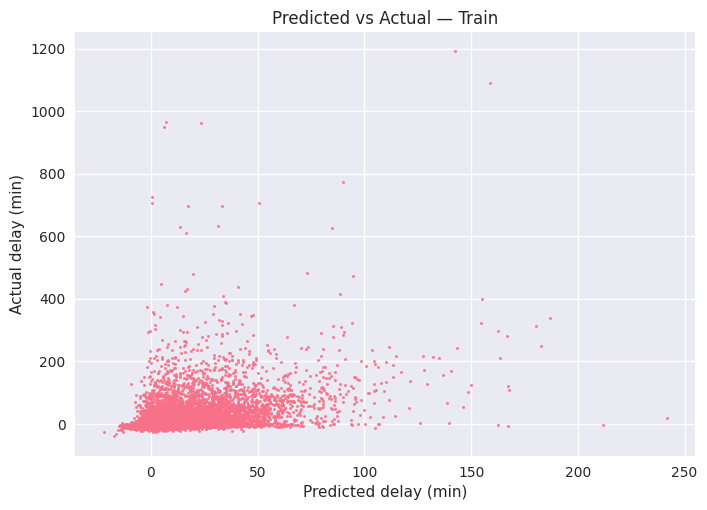

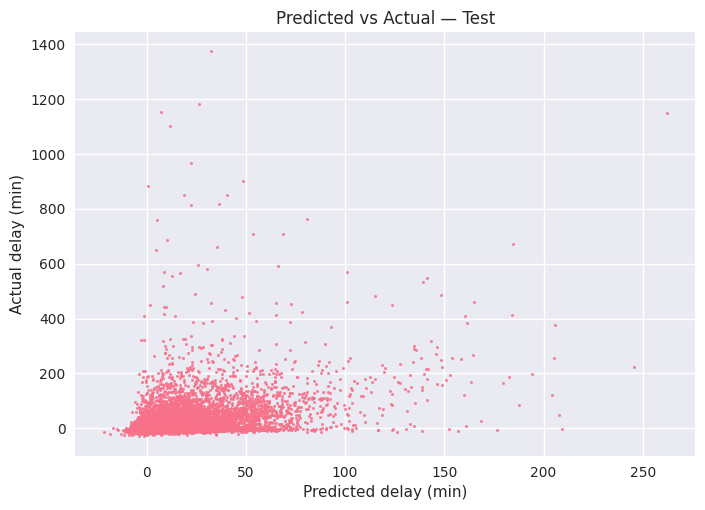

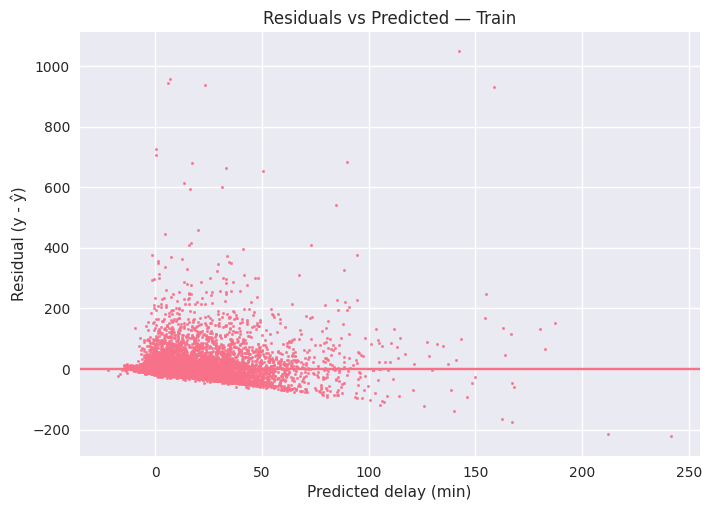

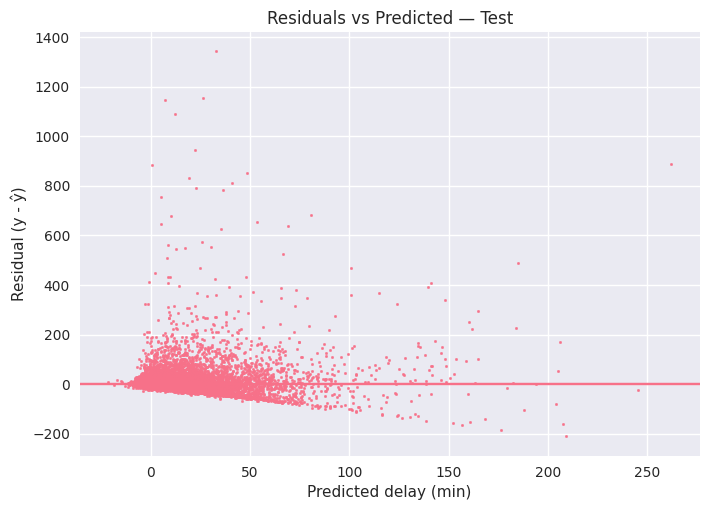

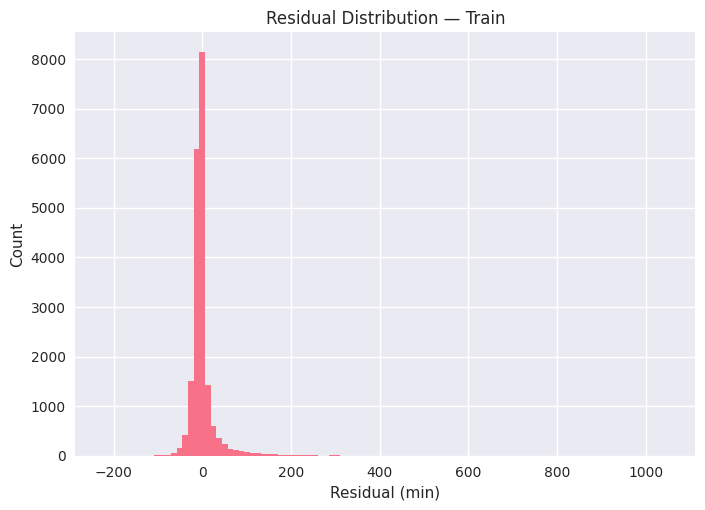

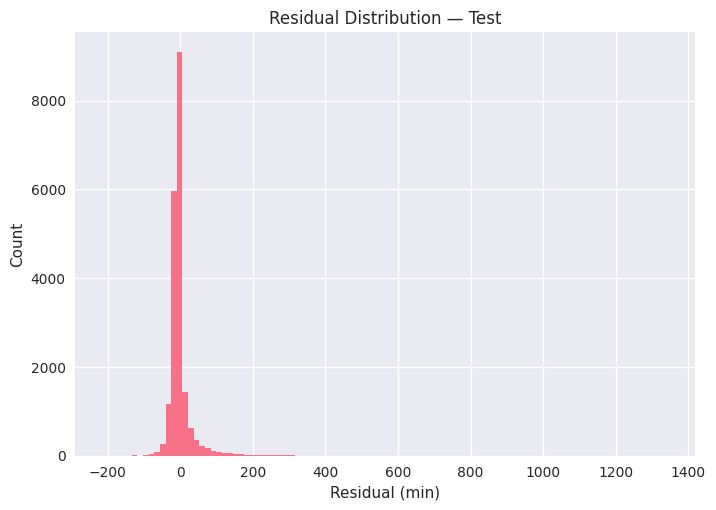

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt

LABEL = "DEP_DELAY_CAPPED"
PRED  = "prediction_minutes"

def to_pd(df, n=20000):
    if df is None:
        return None
    cnt = df.count()
    frac = 1.0 if cnt <= n else n / cnt
    pdf = (df
           .withColumn("residual", F.col(LABEL) - F.col(PRED))
           .select(LABEL, PRED, "residual")
           .sample(False, frac))
    return pdf.toPandas()

pd_tr = to_pd(train_pred)
pd_te = to_pd(test_pred)

# 1) Predicted vs Actual — Train
plt.figure()
plt.scatter(pd_tr[PRED], pd_tr[LABEL], s=3)
plt.xlabel("Predicted delay (min)")
plt.ylabel("Actual delay (min)")
plt.title("Predicted vs Actual — Train")
plt.show()

# 2) Predicted vs Actual — Test
if pd_te is not None:
    plt.figure()
    plt.scatter(pd_te[PRED], pd_te[LABEL], s=3)
    plt.xlabel("Predicted delay (min)")
    plt.ylabel("Actual delay (min)")
    plt.title("Predicted vs Actual — Test")
    plt.show()

# 3) Residuals vs Predicted — Train
plt.figure()
plt.scatter(pd_tr[PRED], pd_tr["residual"], s=3)
plt.axhline(0)
plt.xlabel("Predicted delay (min)")
plt.ylabel("Residual (y - ŷ)")
plt.title("Residuals vs Predicted — Train")
plt.show()

# 4) Residuals vs Predicted — Test
if pd_te is not None:
    plt.figure()
    plt.scatter(pd_te[PRED], pd_te["residual"], s=3)
    plt.axhline(0)
    plt.xlabel("Predicted delay (min)")
    plt.ylabel("Residual (y - ŷ)")
    plt.title("Residuals vs Predicted — Test")
    plt.show()

# 5) Residual distribution — Train
plt.figure()
plt.hist(pd_tr["residual"], bins=100)
plt.xlabel("Residual (min)")
plt.ylabel("Count")
plt.title("Residual Distribution — Train")
plt.show()

# 6) Residual distribution — Test
if pd_te is not None:
    plt.figure()
    plt.hist(pd_te["residual"], bins=100)
    plt.xlabel("Residual (min)")
    plt.ylabel("Count")
    plt.title("Residual Distribution — Test")
    plt.show()